# What drives the price of a car?

![](images/kurt.jpeg)

**OVERVIEW**

In this application, you will explore a dataset from kaggle. The original dataset contained information on 3 million used cars. The provided dataset contains information on 426K cars to ensure speed of processing.  Your goal is to understand what factors make a car more or less expensive.  As a result of your analysis, you should provide clear recommendations to your client -- a used car dealership -- as to what consumers value in a used car.

### CRISP-DM Framework

<center>
    <img src = images/crisp.png width = 50%/>
</center>


To frame the task, throughout our practical applications we will refer back to a standard process in industry for data projects called CRISP-DM.  This process provides a framework for working through a data problem.  Your first step in this application will be to read through a brief overview of CRISP-DM [here](https://mo-pcco.s3.us-east-1.amazonaws.com/BH-PCMLAI/module_11/readings_starter.zip).  After reading the overview, answer the questions below.

# **Business Understanding**

From a business perspective, we are tasked with identifying key drivers for used car prices.  In the CRISP-DM overview, we are asked to convert this business framing to a data problem definition.  Using a few sentences, reframe the task as a data task with the appropriate technical vocabulary.

**Data Problem Definition:**

*It is needed to create a model than can predict the price of used cars from the dataset provided. The approach to create this model will be using regression techniques in order to find the best degree that fits data, after creating the model, the most important variables that predict the price should be identified and reported to the client.*

# **Data Understanding**

After considering the business understanding, we want to get familiar with our data.  Write down some steps that you would take to get to know the dataset and identify any quality issues within.  Take time to get to know the dataset and explore what information it contains and how this could be used to inform your business understanding.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import math
#--
from sklearn.preprocessing import OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.linear_model import Ridge
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score

sns.set_style("whitegrid")
sns.set_palette("pastel")
pd.set_option("display.max_columns", None)

In [ ]:
df_cars = pd.read_csv('/content/drive/MyDrive/1.Berkeley/2.Section 2/11.Practical Application 11/practical_application_II_starter/data/vehicles.csv')

In [ ]:
# Display the first few rows
print("\nFirst rows:")
#df_cars.head()
df_cars.tail(4)

In [ ]:

# Show dataset dimensions
print("Dataset shape:", df_cars.shape)

# Show data types and missing values
print("\nColumn info:")
print(df_cars.info())

# Descriptive statistics for numerical variables
print("\nDescriptive statistics:")
print(df_cars.describe())

**Comments:** There are NULL values so a treatment has to be implemented

In [ ]:
# # Select numeric columns
# num_cols = df_cars.select_dtypes(include=['float64', 'int64']).columns

# # Generate one boxplot per numeric variable
# for col in num_cols:
#     fig = px.box(df_cars, y=col, title=f'Boxplot of {col}')
#     fig.show()

# Select numeric columns
num_cols = df_cars.select_dtypes(include=['float64', 'int64']).columns.tolist()

# Create subplot with 1 row and len(num_cols) columns
fig = make_subplots(rows=1, cols=len(num_cols), subplot_titles=num_cols)

# Add a boxplot for each numeric column
for i, col in enumerate(num_cols):
    fig.add_trace(
        go.Box(y=df_cars[col], name=col, boxpoints='outliers'),
        row=1, col=i+1
    )

# Update layout for spacing
fig.update_layout(
    height=500,
    width=300 * len(num_cols),
    title_text="Boxplots of Numerical Features",
    showlegend=False
)

fig.show()

**Comments:** An outliers treatment is needed for numerical variables

In [ ]:

# Columns to plot (in specified order)
columns = ['id', 'price', 'year', 'odometer']

# Create subplot: 1 row, 4 columns
fig = make_subplots(rows=1, cols=4, subplot_titles=columns)

# Add histograms
for i, col in enumerate(columns):
    fig.add_trace(
        go.Histogram(x=df_cars[col], name=col),
        row=1, col=i+1
    )

# Update layout
fig.update_layout(
    height=400,
    width=1600,
    title_text="Histograms of Numerical Features",
    showlegend=False
)

fig.show()

**Comments:** Numerical variables are skewed and has different scales. They need to be transformed before modeling

In [ ]:
# Variables to plot
#columns = ['id', 'price', 'year', 'odometer']

# Create subplots: 1 row, 4 columns
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(20, 5))

# Plot each histogram using Seaborn
for i, col in enumerate(columns):
    sns.histplot(data=df_cars, x=col, bins=30, ax=axes[i], color='skyblue', edgecolor='black')
    axes[i].set_title(f'Histogram of {col}')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Frequency')

plt.tight_layout()
plt.show()


**Price variable**

In [ ]:
# histogram of price variable for some values
fig = px.histogram(df_cars[df_cars['price'] <= 3000], x="price")
fig.show()


**Odometer variable**

In [ ]:
# histogram of price variable for some values
fig = px.histogram(df_cars[df_cars['odometer'] <= 20000], x="odometer")
fig.show()


**Comments:** A threshold for price should be defined. In this case, rows with **price  < 1000 will be deleted**. Due to this dataset is about used cars, **Odometer** variable can not be Zero, so that rows will be deleted

In [ ]:
# Select categorical columns
cat_cols = df_cars.select_dtypes(include='object').columns.tolist()

# Define grid layout: 4 columns per row
cols = 4
rows = math.ceil(len(cat_cols) / cols)

# Create figure and axes
fig, axes = plt.subplots(rows, cols, figsize=(24, 5 * rows))
axes = axes.flatten()

# Generate a countplot for each categorical feature
for i, col in enumerate(cat_cols):
    sns.countplot(data=df_cars, x=col, ax=axes[i], order=df_cars[col].value_counts().index[:10])
    axes[i].set_title(f'Countplot of {col}')
    axes[i].tick_params(axis='x', rotation=45)

# Remove unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


**Comments:** Categorical variables need to be treated or may be grouped. Some of them have few counts. **VIN** and **title_status** columns should be deleted from the dataframe for modeling. **Colors** green, custom, brown and yellow will be grouped as "Others". **Fuel** variable will be mapped as "gas" and "others". **Transmision** will be mapped as "automatic" and "others". **Condition** column will be mapped as "godd", "excellent", "like new" and "Others"

In [ ]:
df_cars['region'].value_counts()

**Comments:** Due to huge dispersity (404 unique values), **Region** column will be droped

In [ ]:
df_cars['model'].value_counts()

**Comments:** Due to huge dispersity (29,649 unique values), **Model** column will be droped

In [ ]:
# Detect missing values
missing_values = df_cars.isnull().sum().sort_values(ascending=False)
miss = missing_values.to_frame() #= missing_values[missing_values > 0]
miss = miss.rename(columns={0: 'counts'})
miss['porc_missing'] = (miss['counts']/df_cars.shape[0])*100
miss

**Comments:** **Size** column should be eliminated due to its 70% of Null values, the rest variables will have a Null row elimination. Column id will be eliminated also

In [ ]:
df_cars[df_cars['price']==0]

**Comments:** Rows with **price = 0** should be deleted since this is the target variable

In [ ]:
# Calculate the average price per state
average_price_by_state = df_cars.groupby('state')['price'].mean().sort_values(ascending=False)
# average_price_by_state

plt.figure(figsize=(15, 6))
sns.barplot(x=average_price_by_state.index, y=average_price_by_state.values)
plt.xticks(rotation=90)
plt.xlabel('State')
plt.ylabel('Average Price')
plt.title('Average Price of Cars per State')
plt.tight_layout()
plt.show()

# Calculate the average price per state
median_price_by_state = df_cars.groupby('state')['price'].median().sort_values(ascending=False)
# average_price_by_state

plt.figure(figsize=(15, 6))
sns.barplot(x=median_price_by_state.index, y=median_price_by_state.values)
plt.xticks(rotation=90)
plt.xlabel('State')
plt.ylabel('Median Price')
plt.title('Median Price of Cars per State')
plt.tight_layout()
plt.show()


**Comments:** It is observed that **price is different across states**, as average and as median. However due to its complexity it is a candidate to drop

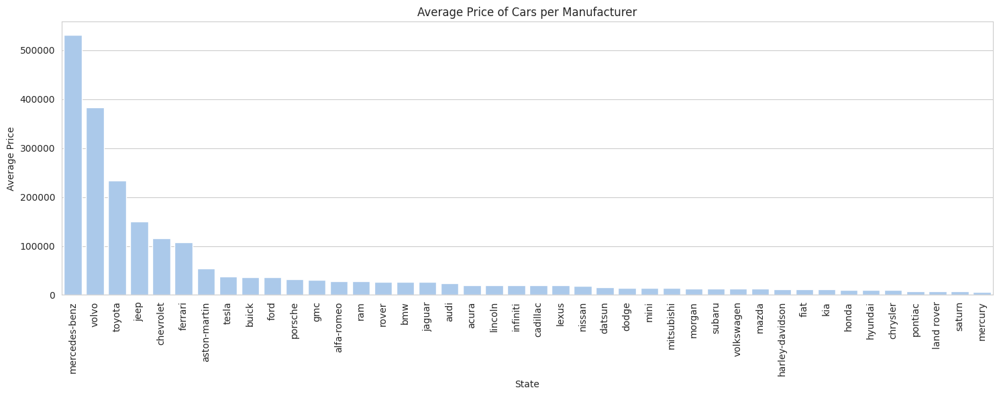

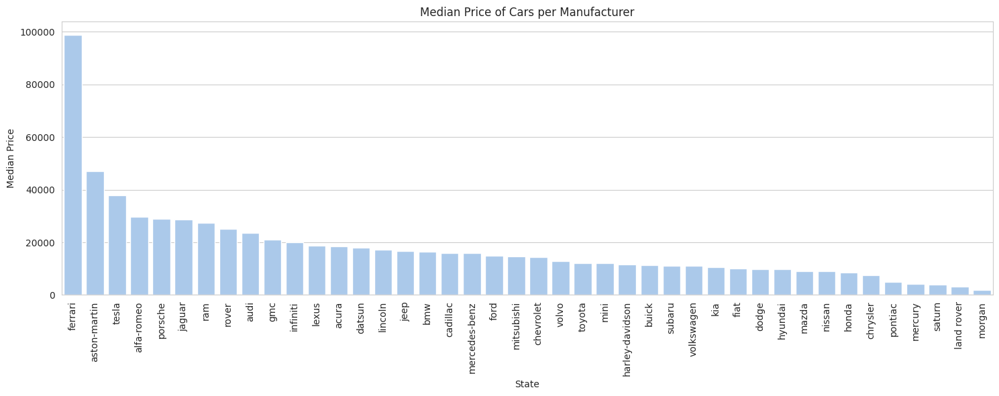

In [ ]:
# Calculate the average price per state
average_price_by_state = df_cars.groupby('manufacturer')['price'].mean().sort_values(ascending=False)
# average_price_by_state

plt.figure(figsize=(15, 6))
sns.barplot(x=average_price_by_state.index, y=average_price_by_state.values)
plt.xticks(rotation=90)
plt.xlabel('State')
plt.ylabel('Average Price')
plt.title('Average Price of Cars per Manufacturer')
plt.tight_layout()
plt.show()

# Calculate the average price per state
median_price_by_state = df_cars.groupby('manufacturer')['price'].median().sort_values(ascending=False)
# average_price_by_state

plt.figure(figsize=(15, 6))
sns.barplot(x=median_price_by_state.index, y=median_price_by_state.values)
plt.xticks(rotation=90)
plt.xlabel('State')
plt.ylabel('Median Price')
plt.title('Median Price of Cars per Manufacturer')
plt.tight_layout()
plt.show()

**Comments:** It is observed that **price is different across manufacturers**, as average and as median

**Comments:** Due to Manufacturer is an important business variable and price varies across them, it is proposed to encode this categories after doing some grouping. for example: High+, High, Medium, low

# **Data Preparation**
After our initial exploration and fine tuning of the business understanding, it is time to construct our final dataset prior to modeling.  Here, we want to make sure to handle any integrity issues and cleaning, the engineering of new features, any transformations that we believe should happen (scaling, logarithms, normalization, etc.), and general preparation for modeling with `sklearn`.

In [ ]:
# Dropping unnecessary columns
df_cleaned = df_cars.drop(['id','size','VIN','title_status','region','model'], axis=1)

# Drop rows with missing values
df_cleaned = df_cleaned.dropna()

# Drop price = 0 rows
df_cleaned = df_cleaned[df_cleaned['price'] >= 1000]

# Drop odometer = 0 rows
df_cleaned = df_cleaned[df_cleaned['odometer'] >= 1000]

print(df_cars.shape)
print(df_cleaned.shape)

(426880, 18)
(108927, 12)


In [ ]:
df_cleaned.head()
#df_cleaned['paint_color'].unique()

**Comments:** A new variable that contains the difference between current year and year variable will be created

In [ ]:
#Create a new variable called years_used that store the difference between current year and year variable
df_cleaned['years_used'] = 2025 - (df_cleaned['year'].astype(int))
#df_cleaned['years_used'].min()
#df_cleaned.head()

df_cleaned['years_used'].hist().set_title('Years of use')


**Outliers traetment**

**IQR outliers detection**

In [ ]:
# # Detect outliers in numerical columns using IQR
# numeric_cols = df_cleaned.select_dtypes(include=['float64', 'int64']).columns

# # Remove outliers using IQR for each numeric column
# for col in numeric_cols:
#     Q1 = df_cleaned[col].quantile(0.25)
#     Q3 = df_cleaned[col].quantile(0.75)
#     IQR = Q3 - Q1
#     lower_bound = Q1 - 1.5 * IQR
#     upper_bound = Q3 + 1.5 * IQR
#     #create resulting dataset
#     df_cleaned_ol = df_cleaned[(df_cleaned[col] >= lower_bound) & (df_cleaned[col] <= upper_bound)]

# # Show final shape
# print("Final shape of df_cleaned:", df_cleaned_ol.shape)

Final shape of df_cleaned: (104264, 13)


In [ ]:
# # Create subplot with 1 row and len(num_cols) columns
# fig = make_subplots(rows=1, cols=len(numeric_cols), subplot_titles=numeric_cols)

# # Add a boxplot for each numeric column
# for i, col in enumerate(numeric_cols):
#     fig.add_trace(
#         go.Box(y=df_cleaned_ol[col], name=col, boxpoints='outliers'),
#         row=1, col=i+1
#     )

# # Update layout for spacing
# fig.update_layout(
#     height=500,
#     width=300 * len(numeric_cols),
#     title_text="Boxplots of Numerical Features",
#     showlegend=False
# )

# fig.show()

**Z-score outliers detection**

In [ ]:
from scipy.stats import zscore

# Select only numeric columns
numeric_cols = df_cleaned.select_dtypes(include=['float64', 'int64']).columns

# Compute Z-scores
z_scores = np.abs(zscore(df_cleaned[numeric_cols]))

# Define threshold
threshold = 1

# Keep rows where all z-scores are below threshold
df_cleaned_ol = df_cleaned[(z_scores < threshold).all(axis=1)]

# Output new shape
print("Shape after Z-Score outlier removal:", df_cleaned_ol.shape)


Shape after Z-Score outlier removal: (92832, 13)


In [ ]:
# Create subplot with 1 row and len(num_cols) columns
fig = make_subplots(rows=1, cols=len(numeric_cols), subplot_titles=numeric_cols)

# Add a boxplot for each numeric column
for i, col in enumerate(numeric_cols):
    fig.add_trace(
        go.Box(y=df_cleaned_ol[col], name=col, boxpoints='outliers'),
        row=1, col=i+1
    )

# Update layout for spacing
fig.update_layout(
    height=500,
    width=300 * len(numeric_cols),
    title_text="Boxplots of Numerical Features",
    showlegend=False
)

fig.show()

**STD for outliers detection**

In [ ]:
# # Select only numeric columns
# numeric_cols = df_cleaned.select_dtypes(include=['float64', 'int64']).columns

# # Define threshold (e.g., 3 standard deviations)
# threshold = 3

# # Remove rows with any numeric value outside the threshold range
# for col in numeric_cols:
#     mean = df_cleaned[col].mean()
#     std = df_cleaned[col].std()
#     lower_bound = mean - threshold * std
#     upper_bound = mean + threshold * std
#     df_cleaned_ol = df_cleaned[(df_cleaned[col] >= lower_bound) & (df_cleaned[col] <= upper_bound)]

# # Output new shape
# print("Shape after standard deviation outlier removal:", df_cleaned_ol.shape)


Shape after standard deviation outlier removal: (106387, 13)


In [ ]:
# # Create subplot with 1 row and len(num_cols) columns
# fig = make_subplots(rows=1, cols=len(numeric_cols), subplot_titles=numeric_cols)

# # Add a boxplot for each numeric column
# for i, col in enumerate(numeric_cols):
#     fig.add_trace(
#         go.Box(y=df_cleaned_ol[col], name=col, boxpoints='outliers'),
#         row=1, col=i+1
#     )

# # Update layout for spacing
# fig.update_layout(
#     height=500,
#     width=300 * len(numeric_cols),
#     title_text="Boxplots of Numerical Features",
#     showlegend=False
# )

# fig.show()

**Comments:** After trying outliers detections techniques, the Z-score technique will be considered because it has a better outliers reduction than the others techniques

In [ ]:
# Create a random sample of 1000 rows
df_sample = df_cleaned_ol.sample(n=500, random_state=42)  # Set random_state for reproducibility

# Select only numeric columns for the pairplot
#numeric_cols = df_sample.select_dtypes(include=np.number).columns

# Create the pairplot
sns.pairplot(df_sample[numeric_cols])
plt.show()


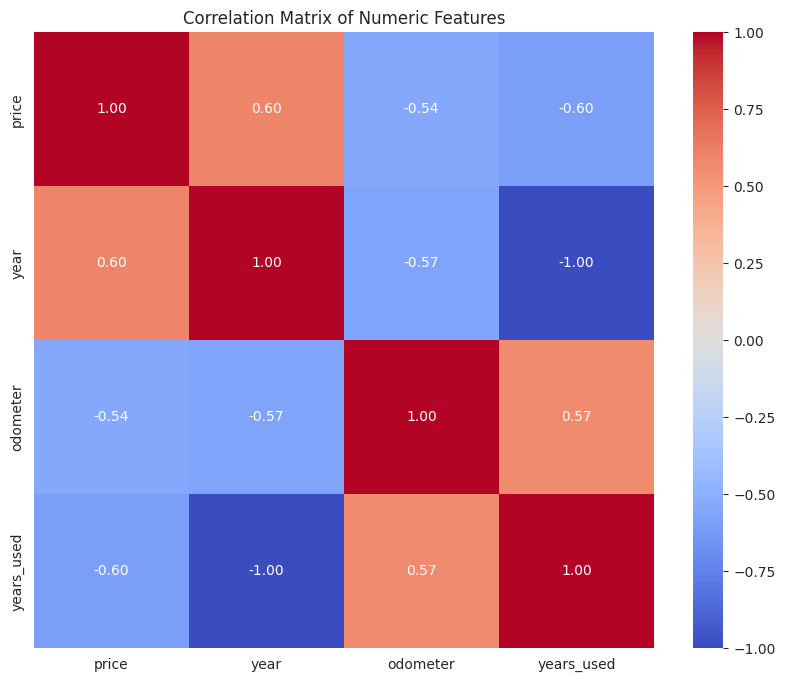

In [ ]:
# prompt: make a correlation matrix for df_sample dataset only for numeric columns

# Assuming df_sample is already defined as in the provided code.
numeric_cols = df_sample.select_dtypes(include=np.number).columns

# Calculate the correlation matrix for numeric columns
correlation_matrix = df_sample[numeric_cols].corr()

# Create a heatmap of the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix of Numeric Features')
plt.show()



**Comments:** Years and Years_used are strongly negative correlated. One of those columns should be dropped

In [ ]:
#dropping year column from dataset

df_cleaned_ol = df_cleaned_ol.drop('year', axis=1)
print(df_cleaned_ol.shape)

(92832, 12)


**Re-mapping Categorical variables**

In [ ]:
# prompt: remap condition variable to have 4 categories: excellent, good, like new and others

# Create a mapping dictionary for the 'condition' column
condition_mapping = {
    'excellent': 'excellent',
    'good': 'good',
    'like new': 'excellent',
    'fair': 'good',
    'new': 'excellent',
    'salvage': 'others',
    'missing': 'others'
}

# Use the mapping dictionary to remap the 'condition' column
df_cleaned_ol['condition'] = df_cleaned_ol['condition'].map(condition_mapping)


In [ ]:
# prompt: remap fuel variable to have 2 categories: gas and others

# Create a mapping dictionary for the 'fuel' column
fuel_mapping = {
    'gas': 'gas',
    'diesel': 'others',
    'hybrid': 'others',
    'electric': 'others',
    'other': 'others'
}

# Use the mapping dictionary to remap the 'fuel' column
df_cleaned_ol['fuel'] = df_cleaned_ol['fuel'].map(fuel_mapping)


In [ ]:
# prompt: remap fuel transmission to have 2 categories: automatic and others

# Create a mapping dictionary for the 'transmission' column
transmission_mapping = {
    'automatic': 'automatic',
    'manual': 'others',
    'other': 'others'
}

# Use the mapping dictionary to remap the 'transmission' column
df_cleaned_ol['transmission'] = df_cleaned_ol['transmission'].map(transmission_mapping)


In [ ]:
# Create a mapping dictionary for the 'transmission' column
cylinders_mapping = {
    '6 cylinders': '6 cylinders',
    '4 cylinders': '4 cylinders',
    '8 cylinders': '8 cylinders',
    '5 cylinders': 'others',
    '10 cylinders': 'others',
    '3 cylinders': 'others',
    '12 cylinders': 'others',
    'other': 'others'
}

# Use the mapping dictionary to remap the 'transmission' column
df_cleaned_ol['cylinders'] = df_cleaned_ol['cylinders'].map(cylinders_mapping)


In [ ]:
# Create a mapping dictionary for the 'paint_color' column
paint_color_mapping = {
    'custom': 'colored',
    'yellow': 'colored',
    'orange': 'colored',
    'purple': 'colored',
    'silver': 'dark',
    'black': 'dark',
    'white': 'white',
    'grey': 'dark',
    'blue': 'colored',
    'red': 'colored',
    'green': 'colored',
    'brown': 'dark'
}

# Use the mapping dictionary to remap the 'paint_color' column
df_cleaned_ol['paint_color'] = df_cleaned_ol['paint_color'].map(paint_color_mapping)




In [ ]:
# prompt: remap type variable having bus and other categories as others

# Create a mapping dictionary for the 'type' column
type_mapping = {
    'SUV': 'SUV-wagon',
    'truck': 'truck',
    'sedan': 'car',
    'coupe': 'car',
    'hatchback': 'car',
    'wagon': 'SUV-wagon',
    'van': 'truck',
    'mini-van': 'truck',
    'pickup': 'truck',
    'convertible': 'car',
    'bus': 'truck',
    'offroad': 'others',
    'other': 'others',
}

# Use the mapping dictionary to remap the 'type' column
df_cleaned_ol['type'] = df_cleaned_ol['type'].map(type_mapping).fillna('others')


In [ ]:
# Select categorical columns
cat_cols = df_cleaned_ol.select_dtypes(include='object').columns.tolist()

# Define grid layout: 4 columns per row
cols = 6
rows = math.ceil(len(cat_cols) / cols)

# Create figure and axes
fig, axes = plt.subplots(rows, cols, figsize=(24, 5 * rows))
axes = axes.flatten()

# Generate a countplot for each categorical feature
for i, col in enumerate(cat_cols):
    sns.countplot(data=df_cleaned_ol, x=col, ax=axes[i], order=df_cleaned_ol[col].value_counts().index[:10])
    axes[i].set_title(f'Countplot of {col}')
    axes[i].tick_params(axis='x', rotation=45)

# Remove unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

In [ ]:
df_cleaned_ol['cylinders'].value_counts()

In [ ]:
# Dropping 173 rows of "others"
df_cleaned_ol = df_cleaned_ol[df_cleaned_ol['condition'] != 'others']
print(df_cleaned_ol.shape)

(92659, 12)


In [ ]:
# Dropping 2900 rows of "others"
df_cleaned_ol = df_cleaned_ol[df_cleaned_ol['type'] != 'others']
print(df_cleaned_ol.shape)

(89749, 12)


In [ ]:
# Dropping 1700 rows of "others"
df_cleaned_ol = df_cleaned_ol[df_cleaned_ol['cylinders'] != 'others']
print(df_cleaned_ol.shape)

(88013, 12)


**Checking for maximum price per Manufacturer**

In [ ]:
df_cleaned_ol.groupby('manufacturer')['price'].max().sort_values(ascending=False).head(10)

**Comments:** Seems to be some error due to some "standard" brands which have a price above 1 Million dollars. Maximum prices should be reviewed

In [ ]:
# Count rows with price above 1000000
rows_above_threshold = df_cleaned_ol[df_cleaned_ol['price'] > 1000000]['price'].count()
print(f"Number of rows with price above 1000000: {rows_above_threshold}")

# Delete rows with price above 1000000
df_cleaned_ol = df_cleaned_ol[df_cleaned_ol['price'] <= 1000000]


Number of rows with price above 1000000: 2


In [ ]:
df_cleaned_ol.groupby('manufacturer')['price'].max().sort_values(ascending=False).head(10)

**Applying Target Encoding (Median Encoding) to Manufacturer and State variables**

In [ ]:
# - MANUFACTURER -
# Compute median price per manufacturer
manufacturer_median_price = df_cleaned_ol.groupby('manufacturer')['price'].median()

# Map the median to a new column
df_cleaned_ol['manufacturer_encoded'] = df_cleaned_ol['manufacturer'].map(manufacturer_median_price)

# Drop original manufacturer column
#df_cleaned_ol = df_cleaned_ol.drop(columns='manufacturer')

# - STATE -
# Compute median price per state
state_median_price = df_cleaned_ol.groupby('state')['price'].median()

# Map the median to a new column
df_cleaned_ol['state_encoded'] = df_cleaned_ol['state'].map(state_median_price)

# Drop original state column
#df_cleaned_ol = df_cleaned_ol.drop(columns='state')

df_cleaned_ol.head()


**Grouping Manufacturers based on Median Price**

In [ ]:
df_cleaned_ol.groupby('manufacturer')['price'].agg(['count','median','mean','min','max']).sort_values(ascending=False, by='median')


In [ ]:
# Create the 'brand_group' column based on 'manufacturer_encoded'
df_cleaned_ol['brand_group'] = pd.cut(df_cleaned_ol['manufacturer_encoded'],
                                      bins=[-float('inf'), 10000, 20000, float('inf')],
                                      labels=['Cheap', 'Regular', 'Luxury'],
                                      right=False)

df_cleaned_ol.head()

In [ ]:
df_cleaned_ol.groupby(['brand_group'])['price'].agg(['count','median','mean','min','max']).sort_values(ascending=False, by='median')

**Dropping unnecesary columns for modeling**

In [ ]:
df_cleaned_ol.drop(columns=['state_encoded','manufacturer_encoded','state','manufacturer'], inplace=True)
df_cleaned_ol.head()


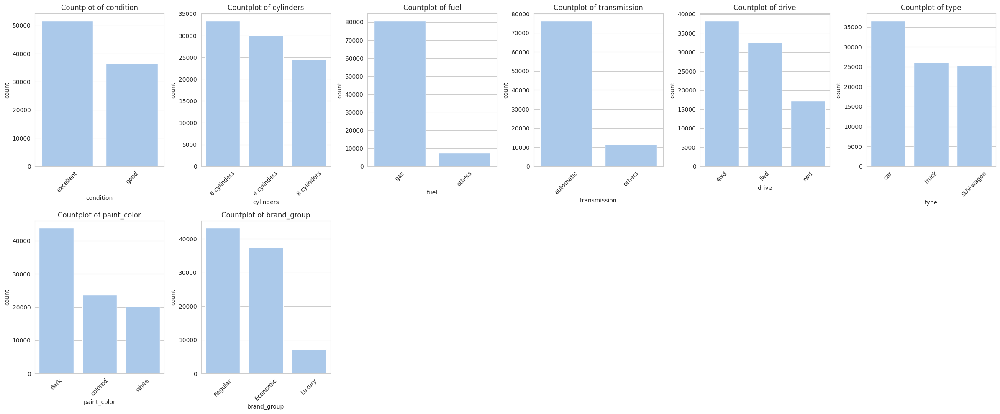

In [ ]:
# Select categorical columns
cat_cols = df_cleaned_ol.select_dtypes(include=['object','category']).columns.tolist()

# Define grid layout: 4 columns per row
cols = 6
rows = math.ceil(len(cat_cols) / cols)

# Create figure and axes
fig, axes = plt.subplots(rows, cols, figsize=(24, 5 * rows))
axes = axes.flatten()

# Generate a countplot for each categorical feature
for i, col in enumerate(cat_cols):
    sns.countplot(data=df_cleaned_ol, x=col, ax=axes[i], order=df_cleaned_ol[col].value_counts().index[:10])
    axes[i].set_title(f'Countplot of {col}')
    axes[i].tick_params(axis='x', rotation=45)

# Remove unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

In [ ]:
# Sample the DataFrame
df_sample = df_cleaned_ol.sample(n=500, random_state=42)

# Apply log transformation to 'price' and 'years_used'
df_sample['log_price'] = np.log1p(df_cleaned_ol['price'])  # Use log1p to handle zero values
df_sample['log_odometer'] = np.log1p(df_cleaned_ol['odometer'])
df_sample['log_years_used'] = np.log1p(df_cleaned_ol['years_used'])

# Create the pairplot
sns.pairplot(df_sample, vars=['log_price', 'log_odometer','log_years_used'], hue='paint_color')
plt.suptitle("Pairplot by paint_color", y=1.02) # Add title to the pairplot
plt.show()

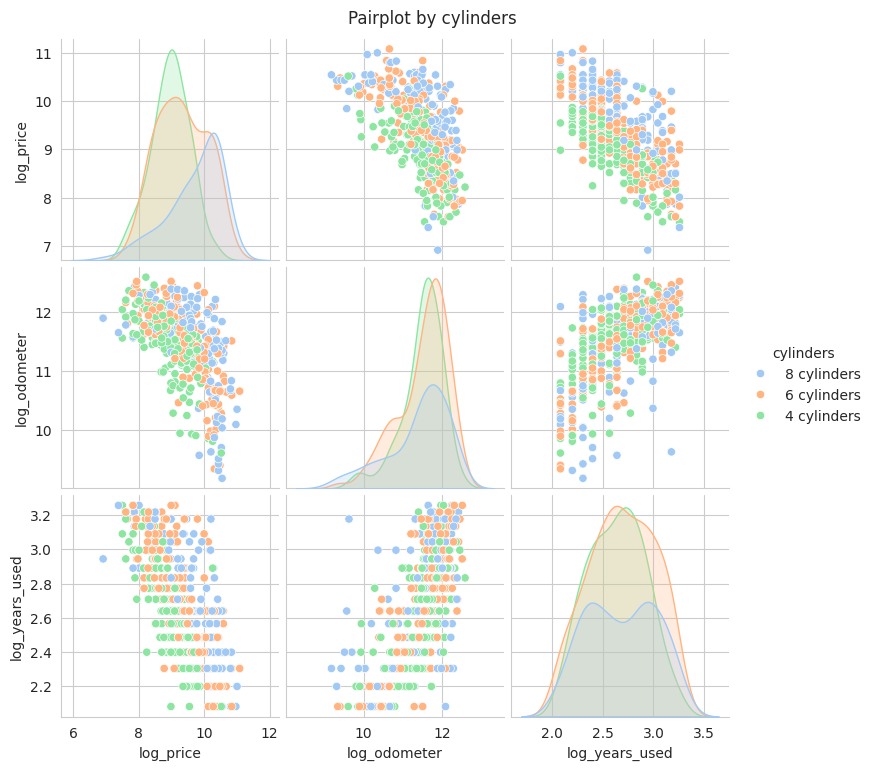

In [ ]:
# Sample the DataFrame
df_sample = df_cleaned_ol.sample(n=500, random_state=42)

# Apply log transformation to 'price' and 'years_used'
df_sample['log_price'] = np.log1p(df_cleaned_ol['price'])  # Use log1p to handle zero values
df_sample['log_odometer'] = np.log1p(df_cleaned_ol['odometer'])
df_sample['log_years_used'] = np.log1p(df_cleaned_ol['years_used'])

# Create the pairplot
sns.pairplot(df_sample, vars=['log_price', 'log_odometer','log_years_used'], hue='cylinders')
plt.suptitle("Pairplot by cylinders", y=1.02) # Add title to the pairplot
plt.show()

In [ ]:
# Sample the DataFrame
df_sample = df_cleaned_ol.sample(n=500, random_state=42)

# Apply log transformation to 'price' and 'years_used'
df_sample['log_price'] = np.log1p(df_cleaned_ol['price'])  # Use log1p to handle zero values
df_sample['log_odometer'] = np.log1p(df_cleaned_ol['odometer'])
df_sample['log_years_used'] = np.log1p(df_cleaned_ol['years_used'])

# Create the pairplot
sns.pairplot(df_sample, vars=['log_price', 'log_odometer','log_years_used'], hue='fuel')
plt.suptitle("Pairplot by fuel", y=1.02) # Add title to the pairplot
plt.show()

In [ ]:
# Sample the DataFrame
df_sample = df_cleaned_ol.sample(n=500, random_state=42)

# Apply log transformation to 'price' and 'years_used'
df_sample['log_price'] = np.log1p(df_cleaned_ol['price'])  # Use log1p to handle zero values
df_sample['log_odometer'] = np.log1p(df_cleaned_ol['odometer'])
df_sample['log_years_used'] = np.log1p(df_cleaned_ol['years_used'])

# Create the pairplot
sns.pairplot(df_sample, vars=['log_price', 'log_odometer','log_years_used'], hue='drive')
plt.suptitle("Pairplot by drive", y=1.02) # Add title to the pairplot
plt.show()

In [ ]:
# Sample the DataFrame
df_sample = df_cleaned_ol.sample(n=500, random_state=42)

# Apply log transformation to 'price' and 'years_used'
df_sample['log_price'] = np.log1p(df_cleaned_ol['price'])  # Use log1p to handle zero values
df_sample['log_odometer'] = np.log1p(df_cleaned_ol['odometer'])
df_sample['log_years_used'] = np.log1p(df_cleaned_ol['years_used'])

# Create the pairplot
sns.pairplot(df_sample, vars=['log_price', 'log_odometer','log_years_used'], hue='type')
plt.suptitle("Pairplot by type", y=1.02) # Add title to the pairplot
plt.show()

In [ ]:
# Sample the DataFrame
df_sample = df_cleaned_ol.sample(n=500, random_state=42)

# Apply log transformation to 'price' and 'years_used'
df_sample['log_price'] = np.log1p(df_cleaned_ol['price'])  # Use log1p to handle zero values
df_sample['log_odometer'] = np.log1p(df_cleaned_ol['odometer'])
df_sample['log_years_used'] = np.log1p(df_cleaned_ol['years_used'])

# Create the pairplot
sns.pairplot(df_sample, vars=['log_price', 'log_odometer','log_years_used'], hue='condition')
plt.suptitle("Pairplot by condition", y=1.02) # Add title to the pairplot
plt.show()

In [ ]:
# Sample the DataFrame
df_sample = df_cleaned_ol.sample(n=250, random_state=42)

# Apply log transformation to 'price' and 'years_used'
df_sample['log_price'] = np.log1p(df_cleaned_ol['price'])  # Use log1p to handle zero values
df_sample['log_odometer'] = np.log1p(df_cleaned_ol['odometer'])
df_sample['log_years_used'] = np.log1p(df_cleaned_ol['years_used'])

# Create the pairplot
sns.pairplot(df_sample, vars=['log_price', 'log_odometer','log_years_used'], hue='brand_group')
plt.suptitle("Pairplot by brand_group", y=1.02) # Add title to the pairplot
plt.show()

**One-hot Encoding for categorical variables**

In [ ]:
df_cleaned_ol.info()

In [ ]:
# Create a copy of the DataFrame
df_cleaned_encoded = df_cleaned_ol.copy()

# Create an instance of OneHotEncoder
encoder = OneHotEncoder(handle_unknown='ignore', sparse_output=False, drop='if_binary')

# Identify categorical columns excluding 'manufacturer' and 'state'
categorical_cols = df_cleaned_encoded.select_dtypes(include=['object','category']).columns.tolist()

# Fit and transform the categorical features
encoded_features = encoder.fit_transform(df_cleaned_encoded[categorical_cols])

# Create a new DataFrame with the encoded features
encoded_df = pd.DataFrame(encoded_features, columns=encoder.get_feature_names_out(categorical_cols), index=df_cleaned_encoded.index)

# Drop the original categorical columns from the DataFrame
df_cleaned_encoded = df_cleaned_encoded.drop(columns=categorical_cols)

# Concatenate the encoded features with the original DataFrame
df_cleaned_encoded = pd.concat([df_cleaned_encoded, encoded_df], axis=1)

df_cleaned_encoded.head()

### Modeling

With your (almost?) final dataset in hand, it is now time to build some models.  Here, you should build a number of different regression models with the price as the target.  In building your models, you should explore different parameters and be sure to cross-validate your findings.

In [ ]:
# Separar variables predictoras y objetivo
X = df_cleaned_encoded.drop(['price'], axis=1)
y = df_cleaned_encoded['price']

# División de datos en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Definición del pipeline
pipe = Pipeline([
    ('poly', PolynomialFeatures(include_bias=False)),
    ('scaler', StandardScaler()),
    ('ridge', Ridge())
])

# Definir los hiperparámetros a buscar
param_grid = {
    'poly__degree': [1,2,3],
    'ridge__alpha': [0.01, 0.1, 1]
}

# GridSearch con validación cruzada
grid = GridSearchCV(pipe, param_grid, cv=3, scoring='neg_root_mean_squared_error', n_jobs=-1, return_train_score=True)
grid.fit(X_train, y_train)

# Predicción sobre el conjunto de prueba
y_pred_test = grid.predict(X_test)
y_pred_train = grid.predict(X_train)

# Evaluación del modelo
mse_train = mean_squared_error(y_train, y_pred_train)
mse_test = mean_squared_error(y_test, y_pred_test)
r2_train = r2_score(y_train, y_pred_train)
r2_test = r2_score(y_test, y_pred_test)
r2_val = grid.best_score_**2  # Nota: R² no se calcula directamente en GridSearch, se estima a partir del RMSE negativo si se desea

# Mostrar resultados
print("Mejores hiperparámetros encontrados:")
print(grid.best_params_)
print("\nMejor score de validación (RMSE):", -grid.best_score_)
print("MSE en entrenamiento:", mse_train)
print("MSE en test:", mse_test)
print("R² en entrenamiento:", r2_train)
print("R² en test:", r2_test)
print("Estimación aproximada de R² en validación:", r2_val)



Mejores hiperparámetros encontrados:
{'poly__degree': 3, 'ridge__alpha': 1}

Mejor score de validación (RMSE): 5026.063374813421
MSE en entrenamiento: 24341020.500901554
MSE en test: 24412805.253009308
R² en entrenamiento: 0.8250480456532328
R² en test: 0.8248999443100847
Estimación aproximada de R² en validación: 25261313.04764088


### Evaluation

With some modeling accomplished, we aim to reflect on what we identify as a high quality model and what we are able to learn from this.  We should review our business objective and explore how well we can provide meaningful insight on drivers of used car prices.  Your goal now is to distill your findings and determine whether the earlier phases need revisitation and adjustment or if you have information of value to bring back to your client.

In [ ]:
# Crear un DataFrame con MSE de cada modelo entrenado
df_results = pd.DataFrame()
for i, params in enumerate(grid.cv_results_['params']):
    model_name = f"Ridge + {params['poly__degree']} + {params['ridge__alpha']}"
    mse_train_model = round((grid.cv_results_['mean_train_score'][i]) ** 2, 2)
    mse_val_model = round((grid.cv_results_['mean_test_score'][i]) ** 2, 2)
    df_results = pd.concat([df_results, pd.DataFrame({
        'Modelo + degree + alpha': [model_name],
        'MSE_train': [mse_train_model],
        'MSE_val': [mse_val_model]
    })], ignore_index=True)

print("\nResumen de MSE por modelo:")
df_results.sort_values(by='MSE_val', ascending=True)


In [ ]:
# Visualización de valores reales vs predichos
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred_test, alpha=0.5, edgecolors='k')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.xlabel("Precio real")
plt.ylabel("Precio predicho")
plt.title("Comparación de valores reales vs predichos")
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
# GridSearch con validación cruzada utilizando R² como métrica de evaluación
grid = GridSearchCV(pipe, param_grid, cv=5, scoring='r2', n_jobs=-1, return_train_score=True)
grid.fit(X_train, y_train)

# Predicción sobre el conjunto de prueba
y_pred_test = grid.predict(X_test)
y_pred_train = grid.predict(X_train)

# Evaluación del modelo
mse_train = mean_squared_error(y_train, y_pred_train)
mse_test = mean_squared_error(y_test, y_pred_test)
r2_train = r2_score(y_train, y_pred_train)
r2_test = r2_score(y_test, y_pred_test)
r2_val = grid.best_score_

# Mostrar resultados
print("Mejores hiperparámetros encontrados:")
print(grid.best_params_)
print("\nMejor score de validación (R²):", r2_val)
print("MSE en entrenamiento:", mse_train)
print("MSE en test:", mse_test)
print("R² en entrenamiento:", r2_train)
print("R² en test:", r2_test)
print("R² en validación (cross-val promedio):", r2_val)


Mejores hiperparámetros encontrados:
{'poly__degree': 3, 'ridge__alpha': 1}

Mejor score de validación (R²): 0.8192131010947665
MSE en entrenamiento: 24341020.500901554
MSE en test: 24412805.253009308
R² en entrenamiento: 0.8250480456532328
R² en test: 0.8248999443100847
R² en validación (cross-val promedio): 0.8192131010947665


In [ ]:
# Crear un DataFrame con R² de cada modelo entrenado
df_results_r2 = pd.DataFrame()
for i, params in enumerate(grid.cv_results_['params']):
    model_name = f"Ridge + {params['poly__degree']} + {params['ridge__alpha']}"
    r2_train_model = round(grid.cv_results_['mean_train_score'][i], 4)
    r2_val_model = round(grid.cv_results_['mean_test_score'][i], 4)
    df_results_r2 = pd.concat([df_results_r2, pd.DataFrame({
        'Modelo + degree + alpha': [model_name],
        'R2_train': [r2_train_model],
        'R2_val': [r2_val_model]
    })], ignore_index=True)

print("\nResumen de R² por modelo:")
df_results_r2.sort_values(by='R2_val', ascending=False)

In [ ]:
# prompt: merge df_results and df_results_r2 using the first column as index

# Merge df_results and df_results_r2 using the first column as index
df_merged = pd.merge(df_results, df_results_r2, on='Modelo + degree + alpha')

df_merged['MSE_train'] = df_merged['MSE_train'].apply(lambda x: "{:,}".format(x))
df_merged['MSE_val'] = df_merged['MSE_val'].apply(lambda x: "{:,}".format(x))

df_merged.sort_values(by='MSE_val', ascending=True)


,Modelo + degree + alpha,MSE_train,MSE_val,R2_train,R2_val
8,Ridge + 3 + 1,"24,160,322.31","25,261,313.05",0.8257,0.8192
7,Ridge + 3 + 0.1,"24,160,278.46","25,262,137.3",0.8257,0.8192
6,Ridge + 3 + 0.01,"24,160,277.99","25,262,226.12",0.8257,0.8192
5,Ridge + 2 + 1,"28,366,929.88","28,604,693.38",0.7959,0.7944
4,Ridge + 2 + 0.1,"28,366,926.08","28,604,753.26",0.7959,0.7944
3,Ridge + 2 + 0.01,"28,366,926.04","28,604,759.61",0.7959,0.7944
2,Ridge + 1 + 1,"42,452,039.49","42,479,243.6",0.6948,0.6946
1,Ridge + 1 + 0.1,"42,452,039.48","42,479,244.52",0.6948,0.6946
0,Ridge + 1 + 0.01,"42,452,039.48","42,479,244.61",0.6948,0.6946


In [ ]:
# Gráfico de barras de importancia de características del mejor modelo
best_model = grid.best_estimator_
poly_features = best_model.named_steps['poly'].get_feature_names_out(X.columns)
coefs = best_model.named_steps['ridge'].coef_

importance_df = pd.DataFrame({
    'Feature': poly_features,
    'Importance': np.abs(coefs)
    #'Importance': coefs
}).sort_values(by='Importance', ascending=False).head(20)

plt.figure(figsize=(10, 6))
plt.barh(importance_df['Feature'][::-1], importance_df['Importance'][::-1])
plt.xlabel("Absolute Coeficient")
plt.title("Feature Importance - Best Model")
plt.tight_layout()
plt.show()



In [ ]:
# Gráfico de barras de importancia de características del mejor modelo
best_model = grid.best_estimator_
poly_features = best_model.named_steps['poly'].get_feature_names_out(X.columns)
coefs = best_model.named_steps['ridge'].coef_

importance_df = pd.DataFrame({
    'Feature': poly_features,
    'Coeficiente': coefs
}).sort_values(by='Coeficiente', key=abs, ascending=False).head(20)

plt.figure(figsize=(10, 6))
colors = ['lightgreen' if c > 0 else 'lightcoral' for c in importance_df['Coeficiente']]
plt.barh(importance_df['Feature'][::-1], importance_df['Coeficiente'][::-1], color=colors[::-1])
plt.xlabel("Coeficient")
plt.title("Feature Importance - Best Model (signed)")
plt.tight_layout()
plt.show()

### Deployment

Now that we've settled on our models and findings, it is time to deliver the information to the client.  You should organize your work as a basic report that details your primary findings.  Keep in mind that your audience is a group of used car dealers interested in fine tuning their inventory.

# **Used Cars Findings**

**1. Preliminar overview**

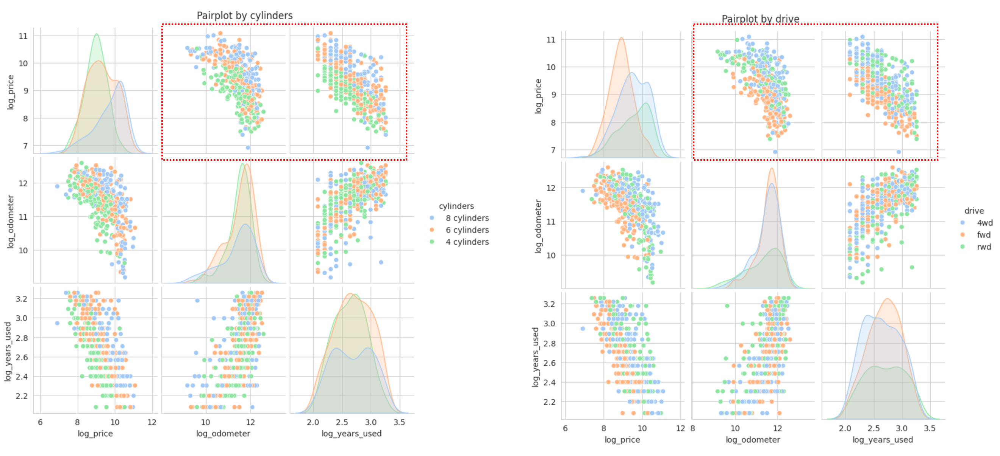

**Comments:**

*   Observation tell us that price decreases as odometer measures and years of used increase
*   Price increase if there are more cylinders in the vehicle
*   4wd vehicles tends to be more expensive than the others (fwd or rwd)
*   odometer measures increases as years of use increase

increase

**2. Modeling Results**

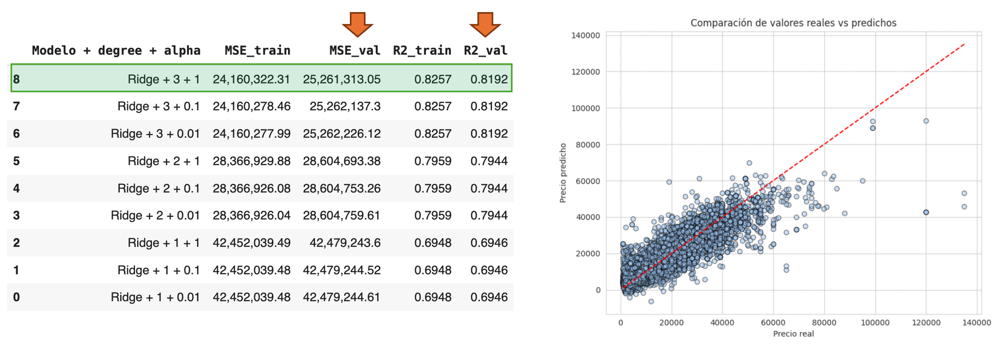

**Comments:**
*   Several regression models were train using Ridge regularization for performance improvement
*   The best fit to data was obtained by a polynomic regression of degree 3 which got a **R2 score of 82%** and the lowest MSE (validation sample)

**3. Feature Importance and New Insights**

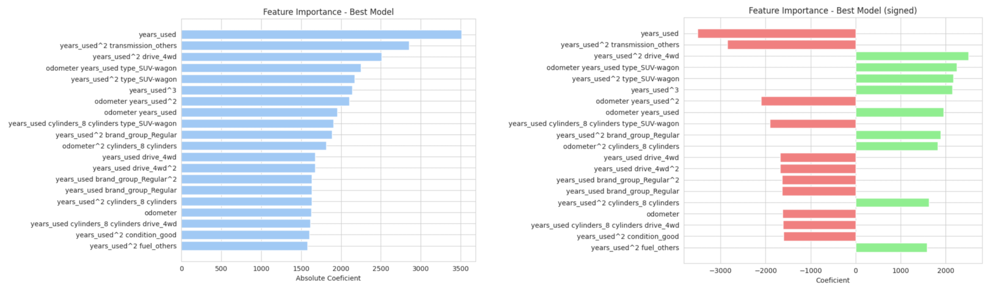

**Comments:**
*   Years of use is the most important variable that impacts on a vehicle's price
*   The transmission type, 4wd drive and odometer measures have an important contribution to the vehicle price.
*   It is important to notice that years of use have an inverse relationship to price, it means that as years of use increase price decrease
*   It is curious that years of use if vehicle is 4wd does not impact negatively on price. 4wd drive helps to increase price